# Problem Statement

here

---

# Homogénéisation des datasets

## Breef peek into the building IDs over years

In [1]:
import os

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 100)

import missingno as msno


import plotly.express as px
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
# import matplotlib as mpl

# import plotly
# from plotly.offline import init_notebook_mode
# init_notebook_mode(connected=True)


# import sys
# import time 
# from os import listdir
# from os.path import isfile, join
# from haversine import haversine


from sklearn.impute import KNNImputer


DATA_DIR = './data'

csv_files = [f for f in os.listdir(DATA_DIR) if 'csv' in f]

dfs = {}
for csv_file in csv_files:
    dfs[int(csv_file[:4])] = pd.read_csv(os.path.join(DATA_DIR, csv_file))

print("The field 'OSEBuildingID' can be used as index:")
for k, v in dfs.items():
    print(f"For {k} - nb unique IDs: {v.OSEBuildingID.nunique()} - shape: {v.shape} - duplicated rows: {v.duplicated().sum()}")

The field 'OSEBuildingID' can be used as index:
For 2015 - nb unique IDs: 3340 - shape: (3340, 42) - duplicated rows: 0
For 2016 - nb unique IDs: 3376 - shape: (3376, 46) - duplicated rows: 0
For 2017 - nb unique IDs: 3461 - shape: (3461, 45) - duplicated rows: 0
For 2019 - nb unique IDs: 3581 - shape: (3581, 42) - duplicated rows: 0
For 2020 - nb unique IDs: 3628 - shape: (3628, 42) - duplicated rows: 0


We can see that a large proportion of the building IDs are present in the following years. There are more recordings over the years probably because more data is provided or new buildings are created. 

In [2]:
for i, k in enumerate(dfs.keys()):
    if i == 0:
        continue
    nb_rows = dfs[list(dfs.keys())[i]].shape[0]
    previous_ids = dfs[list(dfs.keys())[i-1]].OSEBuildingID.unique()
    current_ids = dfs[list(dfs.keys())[i]].OSEBuildingID.unique()
    nb_common_ids = np.intersect1d(previous_ids, current_ids, assume_unique=True).shape[0]
    print(f"For {k}, IDs in common w. previous year {nb_common_ids / nb_rows * 100:.1f}%")

For 2016, IDs in common w. previous year 97.3%
For 2017, IDs in common w. previous year 96.5%
For 2019, IDs in common w. previous year 94.7%
For 2020, IDs in common w. previous year 97.3%


## Analysis of columns in common or absent

In [3]:
pd.concat([df.dtypes for df in dfs.values()], axis=1) \
    .rename(columns={i: k for (i, k) in zip(range(len(dfs.keys())), dfs.keys())}) \
    .style.applymap(lambda x: '' if x==x else 'background-color: yellow')

,2015,2016,2017,2019,2020
OSEBuildingID,int64,int64,int64,int64,int64
DataYear,int64,int64,int64,int64,int64
BuildingType,object,object,object,object,object
PrimaryPropertyType,object,object,object,object,nan
PropertyName,object,object,object,nan,nan
TaxParcelIdentificationNumber,object,object,object,object,object
Location,object,nan,nan,nan,nan
CouncilDistrictCode,int64,int64,float64,float64,float64
Neighborhood,object,object,object,object,object
YearBuilt,int64,int64,float64,int64,int64


we can easily see that 'Location' in the 2015 dataset is in fact an aggregation of 'Address', 'City', 'State', 'ZipCode', 'Latitude', 'Longitude' of the dataset of the following years

In [4]:
print(dfs[2015].Location.head(2).values)
dfs[2016][['Address', 'City', 'State', 'ZipCode', 'Latitude', 'Longitude' ]].head(2)

['411 W REPUBLICAN ST\nSEATTLE, WA 98119\n(47.62305186, -122.3623121)'
 '6100 CORSON AVE S\nSEATTLE, WA 98108\n(47.5477336, -122.3207866)']


,Address,City,State,ZipCode,Latitude,Longitude
0,405 Olive way,Seattle,WA,98101.0,47.61220,-122.33799
1,724 Pine street,Seattle,WA,98101.0,47.61317,-122.33393


in the 2015 dataset 'GHGEmissions(MetricTonsCO2e)' and 'GHGEmissionsIntensity(kgCO2e/ft2)' are similar to 'TotalGHGEmissions', 'GHGEmissionsIntensity' in the 2016 version

In [5]:
display(dfs[2015][['GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)']].describe().T.round(1))
display(dfs[2016][['TotalGHGEmissions', 'GHGEmissionsIntensity']].describe().T.round(1))

,count,mean,std,min,25%,50%,75%,max
GHGEmissions(MetricTonsCO2e),3330.0,110.1,409.5,0.0,9.3,32.7,88.6,11824.9
GHGEmissionsIntensity(kgCO2e/ft2),3330.0,1.0,1.6,0.0,0.1,0.5,1.2,31.4


,count,mean,std,min,25%,50%,75%,max
TotalGHGEmissions,3367.0,119.7,538.8,-0.8,9.5,33.9,93.9,16871.0
GHGEmissionsIntensity,3367.0,1.2,1.8,-0.0,0.2,0.6,1.4,34.1


'Comments' & 'Comment' are useless because those columns quite always Nan in most of the datasets

'PropertyName' has been renamed to 'BuildingName' since 2019:

In [6]:
display(dfs[2017][['PropertyName']].head())
display(dfs[2019][['BuildingName']].head())

,PropertyName
0,Mayflower park hotel
1,Paramount Hotel
2,84SC9-The Westin Seattle
3,HOTEL MAX
4,WARWICK SEATTLE HOTEL (ID8)


,BuildingName
0,MAYFLOWER PARK HOTEL
1,PARAMOUNT HOTEL
2,WESTIN HOTEL (Parent Building)
3,HOTEL MAX
4,WARWICK SEATTLE HOTEL


'YearsENERGYSTARCertified' contains all the years of certifications - all the years between 2000 & 2020 (so we'll count the number of certifications)

In [7]:
display(dfs[2017][~dfs[2017]['YearsENERGYSTARCertified'].isnull()][['OSEBuildingID', 'YearsENERGYSTARCertified' ]].head(2))
print(dfs[2019]['ComplianceIssue'].unique())

,OSEBuildingID,YearsENERGYSTARCertified
37,50,2016
44,57,201820172016


['No Issue' 'Missing 2019 EUI or Electricity Data'
 'Account Requires Verification' 'Default Data'
 'Portfolio Manager Account Not Shared' 'Contact the Help Desk']


the 2019 dataset is the only one to have both 'PrimaryPropertyType' & 'EPAPropertyType' but the 2nd one is more informative, but finally the same thins as 'BuildingType'

In [8]:
df_19 = dfs[2019].copy()
df_19[df_19.PrimaryPropertyType != df_19.EPAPropertyType][['OSEBuildingID', 'BuildingName', 'BuildingType', 'PrimaryPropertyType', 'EPAPropertyType' ]]

,OSEBuildingID,BuildingName,BuildingType,PrimaryPropertyType,EPAPropertyType
9,13,LYON BUILDING,Multifamily MR (5-9),Multifamily Housing,Multifamily MR (5-9)
110,183,"EMERSON HALL, SEATTLE PACIFIC UNIVERSITY",Multifamily LR (1-4),Residence Hall/Dormitory,Multifamily LR (1-4)
160,265,2024 THIRD AVE/YWCA,Multifamily MR (5-9),Multifamily Housing,Multifamily MR (5-9)
161,266,WEST SEATTLE COMM. RESOURCE CENTER/FOOD BANK A...,Multifamily LR (1-4),Multifamily Housing,Multifamily LR (1-4)
169,280,THE WINTONIA,Multifamily MR (5-9),Multifamily Housing,Multifamily MR (5-9)
...,...,...,...,...,...
3573,50535,UPTON FLATS AT HIGH POINT,Multifamily LR (1-4),NaN,NaN
3575,50539,KIARA,Multifamily HR (10+),Multifamily Housing,Multifamily HR (10+)
3576,50540,EVEN HOTELS & STAYBRIDGE SUITES,NonResidential,NaN,NaN
3579,50633,BROADWAY ESTATES LLC,Multifamily MR (5-9),Multifamily Housing,Multifamily MR (5-9)


But 'ListOfAllPropertyUseTypes' add many informations ! It'll interesting to count the number of different types

In [9]:
display(dfs[2017][['ListOfAllPropertyUseTypes']].head())

,ListOfAllPropertyUseTypes
0,Hotel
1,"Hotel, Parking, Restaurant"
2,"Hotel, Parking, Swimming Pool"
3,Hotel
4,"Hotel, Parking, Swimming Pool"


## Aggregation of the datasets for all the years
Concatenation

In [10]:
df_16 = pd.read_csv(os.path.join(DATA_DIR, '2016-building-energy-benchmarking.csv'), index_col=0) \
    .rename(columns={'PropertyName': 'BuildingName'})

df_15 = pd.read_csv(os.path.join(DATA_DIR, '2015-building-energy-benchmarking.csv'), index_col=0) \
    .drop(columns=['Location']) \
    .rename(columns={
         'GHGEmissions(MetricTonsCO2e)': 'TotalGHGEmissions', 
         'GHGEmissionsIntensity(kgCO2e/ft2)': 'GHGEmissionsIntensity',
         'PropertyName': 'BuildingName'}) \
    .join(df_16[['Address', 'City', 'State', 'ZipCode', 'Latitude', 'Longitude']])

df_17 = pd.read_csv(os.path.join(DATA_DIR, '2017-building-energy-benchmarking.csv'), index_col=0) \
    .rename(columns={'PropertyName': 'BuildingName'})

df_19 = pd.read_csv(os.path.join(DATA_DIR, '2019-building-energy-benchmarking.csv'), index_col=0) \
     .drop(columns=['EPAPropertyType']) \
     .join(df_17[['NumberofBuildings','ListOfAllPropertyUseTypes']])

df_20 = pd.read_csv(os.path.join(DATA_DIR, '2020-building-energy-benchmarking.csv'), index_col=0) \
     .drop(columns=['EPAPropertyType']) \
     .join(df_19[['PrimaryPropertyType']]) \
     .join(df_17[['ListOfAllPropertyUseTypes']])

dfs = [df_15, df_16, df_17, df_19, df_20]

pd.concat([df.dtypes for df in dfs], axis=1) \
    .rename(columns={i: k for (i, k) in zip(range(len(dfs)), ['2015', '2016', '2017', '2019', '2020'])}) \
    .style.applymap(lambda x: '' if x==x else 'background-color: yellow')

,2015,2016,2017,2019,2020
DataYear,int64,int64,int64,int64,int64
BuildingType,object,object,object,object,object
PrimaryPropertyType,object,object,object,object,object
BuildingName,object,object,object,object,object
TaxParcelIdentificationNumber,object,object,object,object,object
CouncilDistrictCode,int64,int64,float64,float64,float64
Neighborhood,object,object,object,object,object
YearBuilt,int64,int64,float64,int64,int64
NumberofBuildings,int64,float64,float64,float64,int64
NumberofFloors,float64,int64,float64,int64,int64


Further investigations for the EnergySTAR score compliance criteria would be needed, but are out of scope of this study

In [11]:
df_concat = pd.concat(dfs, axis=0).drop(columns=['Comment', 'Comments', 'OtherFuelUse(kBtu)']) 
print(df_concat.shape)
df_concat.head()

(17386, 45)


,DataYear,BuildingType,PrimaryPropertyType,BuildingName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,ComplianceStatus,Outlier,Address,City,State,ZipCode,Latitude,Longitude,ComplianceIssue
OSEBuildingID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
21548,2015,Multifamily LR (1-4),Low-Rise Multifamily,PUGET VISTA APTS,1992200030,7.0,MAGNOLIA / QUEEN ANNE,1967.0,1.0,4.0,40086,6133.0,33953.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,Not Compliant,NaN,411 W Republican Street,Seattle,WA,98119.0,47.62304,-122.36240,NaN
26379,2015,NonResidential,Hotel,GEORGETOWN INN,6920700025,2.0,GREATER DUWAMISH,1992.0,1.0,3.0,22452,0.0,22452.0,Hotel,Hotel,22452.0,NaN,NaN,NaN,NaN,NaN,78.0,60.3,61.5,118.2,122.0,1354219.0,1381137.0,0.0,172881.0,589893.0,7644.0,764350.0,44.71,1.88,No,Compliant,NaN,6100 Corson Ave South,Seattle,WA,98108.0,47.54774,-122.32091,NaN
26713,2015,Multifamily HR (10+),High-Rise Multifamily,QUINTESSA APTS,5247800955,7.0,DOWNTOWN,2007.0,1.0,13.0,90959,0.0,90959.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,48.0,52.2,115.4,126.2,4361755.0,4748161.0,0.0,829363.0,2829904.0,15320.0,1531968.0,101.09,0.98,No,Compliant,NaN,"201 Yesler Way, Ste 100",Seattle,WA,98104.0,47.60154,-122.33121,NaN
102,2015,NonResidential,Hotel,MARRIOTT RESIDENCE INN,1984200065,3.0,LAKE UNION,1990.0,1.0,7.0,282863,44766.0,238097.0,"Hotel, Parking",Hotel,235788.0,Parking,51537.0,NaN,NaN,NaN,40.0,79.9,85.3,178.1,186.6,18829136.0,20123722.0,0.0,3117920.0,10638785.0,81908.0,8190794.0,509.18,1.64,No,Compliant,NaN,800 Fairview Ave. N,Seattle,WA,98109.0,47.62642,-122.33325,NaN
503,2015,NonResidential,Supermarket/Grocery Store,RESTAURANT DEPOT,1824049003,2.0,GREATER DUWAMISH,2008.0,1.0,1.0,63225,0.0,63225.0,Supermarket/Grocery Store,Supermarket/Grocery Store,63225.0,NaN,NaN,NaN,NaN,NaN,100.0,104.7,104.7,328.8,328.8,6619941.0,6619941.0,0.0,1940194.0,6620217.0,0.0,0.0,46.15,0.28,No,Compliant,NaN,3670 E MARGINAL WAY S,Seattle,WA,98134.0,47.56895,-122.33775,NaN


---

# Macro Analysis - Evolution over years

## Dataset Preparation

before imputation


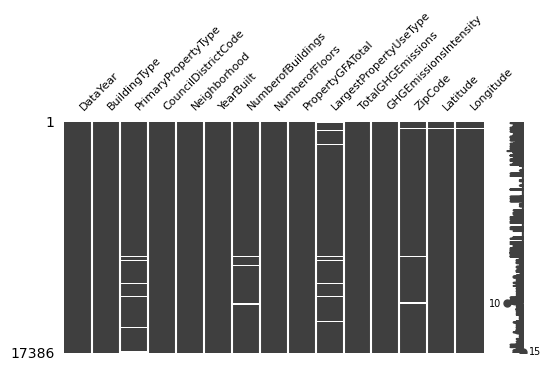

after imputation


<AxesSubplot: >

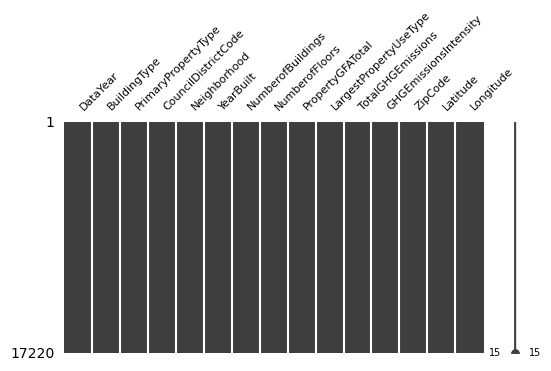

In [13]:
df_all_years = df_concat.copy()

col_kept = ['DataYear', 'BuildingType', 'PrimaryPropertyType', 'CouncilDistrictCode', 'Neighborhood',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'LargestPropertyUseType', 'TotalGHGEmissions', 'GHGEmissionsIntensity',
       'ZipCode', 'Latitude', 'Longitude']

df_all_years = df_all_years[col_kept]
print("before imputation")
msno.matrix(df_all_years, figsize=(6, 3), fontsize=8)
plt.show()


# fillna with same IDs
years = sorted(df_all_years.DataYear.unique())
for year in years:
    year_ref = year + 1 if year != 2020 else 2019
    df_all_years[df_all_years.DataYear == year] = \
    df_all_years[df_all_years.DataYear == year].fillna(df_all_years[df_all_years.DataYear == year_ref])

    
# Keep only the rows with at least 13 non-NA values on 15 cols.
df_all_years.dropna(thresh=13, inplace=True)


# fill zipcode na with values nearby
geo_cols = ['ZipCode', 'Latitude', 'Longitude']
df_all_years[geo_cols] = pd.DataFrame(
    data=KNNImputer(n_neighbors=5).fit_transform(df_all_years[geo_cols]),
    index=df_all_years.index,
    columns=geo_cols
)


PrimaryPropertyType_to_LargestPropertyUseType = df_all_years.groupby('PrimaryPropertyType')['LargestPropertyUseType'].agg(pd.Series.mode).to_dict()
LargestPropertyUseType_to_PrimaryPropertyType = df_all_years.groupby('LargestPropertyUseType')['PrimaryPropertyType'].agg(pd.Series.mode).to_dict()

#df.B = df.B.fillna(df.A.map(dict))

df_all_years.LargestPropertyUseType = df_all_years.LargestPropertyUseType \
    .fillna(df_all_years.PrimaryPropertyType.map(PrimaryPropertyType_to_LargestPropertyUseType))

df_all_years.PrimaryPropertyType = df_all_years.PrimaryPropertyType \
    .fillna(df_all_years.LargestPropertyUseType.map(LargestPropertyUseType_to_PrimaryPropertyType))

# drop few lines with still NaNs
df_all_years.dropna(inplace=True)

assert df_all_years.isnull().sum().sum() == 0


print("after imputation")
msno.matrix(df_all_years, figsize=(6, 3), fontsize=8)

## First insights

evolution by type, neighborhood, nb of floors, nb of buildings, area

Let's get rid off "shared" neighborhoods and water, for the sake of simplicity

In [14]:
df_all_years.Neighborhood = df_all_years.Neighborhood.str.lower()
df_all_years.Neighborhood.replace('delridge neighborhoods', 'delridge', inplace=True)
px.histogram(df_all_years, y='Neighborhood', width=900, height=450)

In [15]:
df_mean_neighborhood = df_all_years[~df_all_years.Neighborhood.str.contains('shared') & 
                                    ~df_all_years.Neighborhood.str.contains('water')] \
    .groupby(['DataYear', 'Neighborhood'])[['TotalGHGEmissions']].mean().round(2)

display(df_mean_neighborhood.head())

px.area(df_mean_neighborhood.reset_index(), x='DataYear', y='TotalGHGEmissions', color='Neighborhood',
        width=800, height=400)

TotalGHGEmissions
DataYear Neighborhood                   
2015     ballard                   78.89
         central                   92.14
         delridge                  67.04
         downtown                 187.85
         east                     171.91

## New buildings vs existing ones

Actually new ids doesn't correspond to new buildings but to buildings that weren't recorded previsously. So we have to use the 'YearBuilt' field instead.

In [16]:
for year in years[1:]:
    #year_ref = year + 1 if year != 2020 else 2019
    new_building_ids = np.setdiff1d(
        df_all_years[df_all_years.DataYear == year].index.values,
        df_all_years[df_all_years.DataYear == year - 1].index.values
    ) 
    print(f"New ids in the dataset of year: {year}:")
#     print(new_building_ids)
    display(df_all_years.loc[new_building_ids][['YearBuilt']].describe().T)

New ids in the dataset of year: 2016:


,count,mean,std,min,25%,50%,75%,max
YearBuilt,320.0,1998.634375,28.923975,1900.0,1993.5,2014.0,2015.0,2018.0


New ids in the dataset of year: 2017:


,count,mean,std,min,25%,50%,75%,max
YearBuilt,325.0,1996.464615,32.366671,1900.0,1987.0,2015.0,2016.0,2019.0


New ids in the dataset of year: 2019:


,count,mean,std,min,25%,50%,75%,max
YearBuilt,16856.0,1970.033697,33.584945,1896.0,1950.0,1977.0,1999.0,2019.0


New ids in the dataset of year: 2020:


,count,mean,std,min,25%,50%,75%,max
YearBuilt,104.0,1992.307692,42.073924,1900.0,1982.25,2018.0,2019.0,2019.0


map with counts: where new buildings are located ?

number of new buildings, no new building in 2018...

<AxesSubplot: xlabel='YearBuilt'>

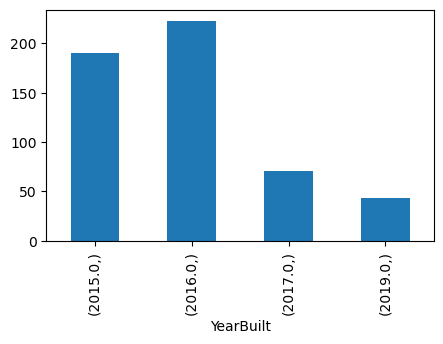

In [17]:
df_new_buildings = df_all_years[df_all_years.YearBuilt.isin(df_all_years.DataYear.unique())]
df_new_buildings[['YearBuilt']].value_counts() \
    .sort_index().plot(kind='bar', figsize=(5, 3))

proportion of new buildings over years

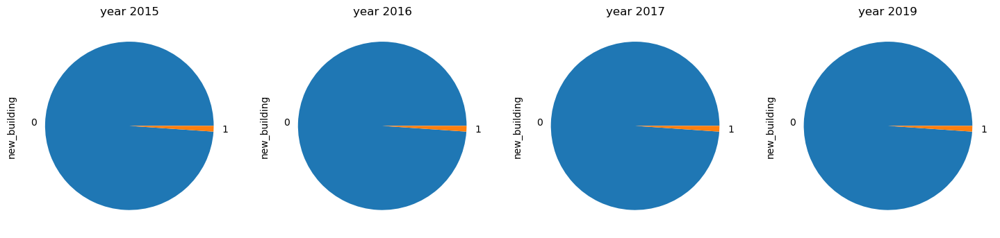

In [18]:
df_all_years['new_building'] = df_all_years.YearBuilt.isin(df_all_years.DataYear.unique()).astype('int') #, 'new_building'] = 'Yes'

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(18, 4))
for i, year in enumerate([2015, 2016, 2017, 2019]):
    df_all_years[df_all_years.DataYear == 2016]['new_building'].value_counts() \
        .plot.pie(y='new_building', ax=axes[i], title=f"year {year}")

<AxesSubplot: xlabel='DataYear'>

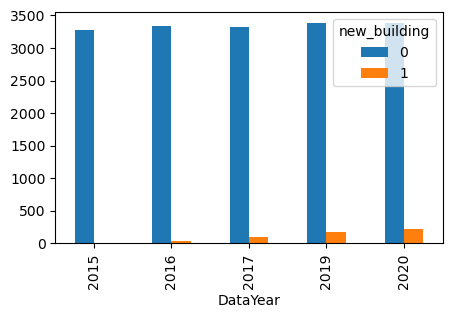

In [19]:
pd.DataFrame(df_all_years[['DataYear', 'new_building']].value_counts()) \
    .reset_index().rename(columns={0: 'count'}).sort_values(['DataYear', 'new_building']) \
    .pivot(index='DataYear', columns='new_building', values='count') \
    .plot.bar(figsize=(5, 3))

performance vs mean of existing

In [20]:
df_all_years.groupby(['DataYear', 'new_building']).agg(
    median_emmission_intensity=("GHGEmissionsIntensity", "median"),
    median_total_emmission=("TotalGHGEmissions", "median"),
).reset_index().pivot(
    index='DataYear', 
    columns='new_building', 
    values=['median_emmission_intensity', 'median_total_emmission']
).round(3)

median_emmission_intensity        median_total_emmission        
new_building                          0      1                      0       1
DataYear                                                                     
2015                               0.46  1.305                  32.77  364.12
2016                               0.61  0.550                  33.50   51.26
2017                               0.58  0.541                  31.81   52.57
2019                               0.70  0.700                  33.00   60.95
2020                               0.60  0.700                  28.75   54.05

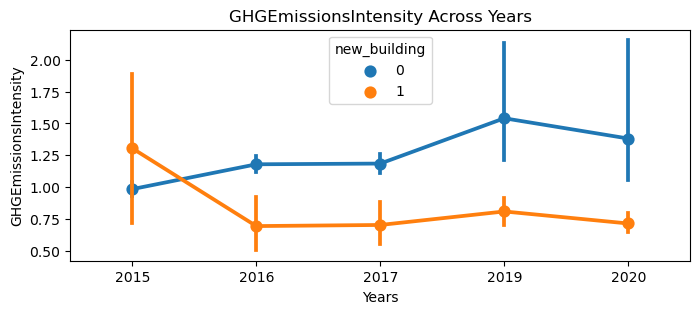

In [21]:
plt.figure(figsize=(8, 3))
sns.pointplot(x=df_all_years.DataYear, y=df_all_years.GHGEmissionsIntensity, hue=df_all_years.new_building)
plt.xlabel("Years")
plt.ylabel("GHGEmissionsIntensity") 
plt.title("GHGEmissionsIntensity Across Years")
plt.show()

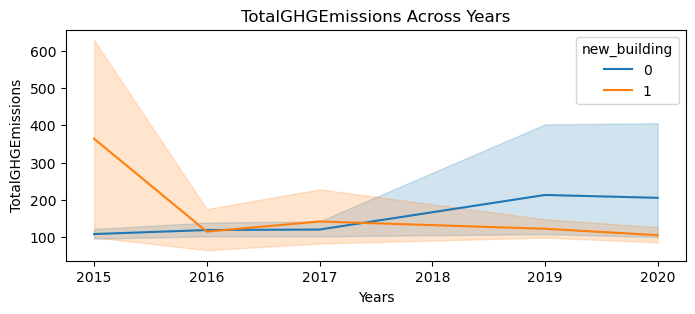

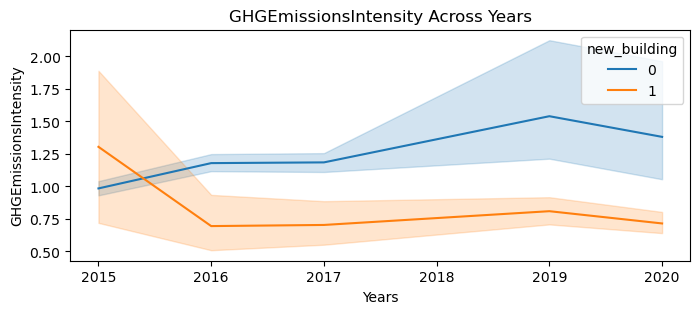

In [22]:
# same thing but less interesting visually
# plt.figure(figsize=(8, 3))
# sns.pointplot(x=df_all_years.DataYear, y=df_all_years.TotalGHGEmissions, hue=df_all_years.new_building)
# plt.xlabel("Years")
# plt.ylabel("TotalGHGEmissions") 
# plt.title("TotalGHGEmissions Across Years")
# plt.show()


plt.figure(figsize=(8, 3))
sns.lineplot(x='DataYear', y="TotalGHGEmissions", hue="new_building", data=df_all_years)
plt.xlabel("Years")
plt.ylabel("TotalGHGEmissions") 
plt.title("TotalGHGEmissions Across Years")
plt.show()

plt.figure(figsize=(8, 3))
sns.lineplot(x='DataYear', y="GHGEmissionsIntensity", hue="new_building", data=df_all_years)
plt.xlabel("Years")
plt.ylabel("GHGEmissionsIntensity") 
plt.title("GHGEmissionsIntensity Across Years")
plt.show()

In [23]:
def evolution_over_years_per_criteria(df, criteria, intensity_or_total):

    df_mean =  df.groupby(['DataYear', criteria, 'new_building'])[[intensity_or_total]].mean().round(2)
    # display(df_mean_neighborhood.head())
    px.area(df_mean.reset_index(), x='DataYear', y=intensity_or_total, color=criteria, 
            line_group="new_building", width=800, height=450).show()

    
evolution_over_years_per_criteria(
    df_all_years[~df_all_years.Neighborhood.str.contains('shared') & 
                 ~df_all_years.Neighborhood.str.contains('water')],
    'Neighborhood',
    'TotalGHGEmissions'
)

In [24]:
evolution_over_years_per_criteria(
    df_all_years[~df_all_years.Neighborhood.str.contains('shared') & 
                 ~df_all_years.Neighborhood.str.contains('water')],
    'Neighborhood',
    'GHGEmissionsIntensity'
)

In [89]:
px.box(
    df_all_years[df_all_years.GHGEmissionsIntensity < 10],
    x="BuildingType",
    y="GHGEmissionsIntensity", 
    color="new_building",
    notched=True,
    width=800,
    height=550
).show()

In [25]:
df_all_years.columns

Index(['DataYear', 'BuildingType', 'PrimaryPropertyType',
       'CouncilDistrictCode', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'LargestPropertyUseType',
       'TotalGHGEmissions', 'GHGEmissionsIntensity', 'ZipCode', 'Latitude',
       'Longitude', 'new_building'],
      dtype='object')

## Analysis of existing buildings

evolution by type, neighborhood, nb of floors, nb of buildings, area

<AxesSubplot: ylabel='BuildingType'>

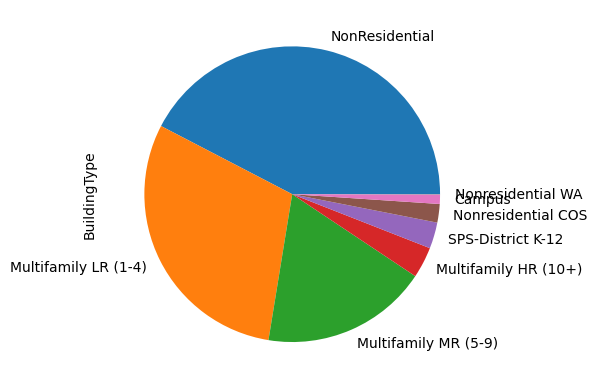

In [26]:
df_all_years.BuildingType.value_counts().plot.pie()

In [27]:
evolution_over_years_per_criteria(
    df_all_years[~df_all_years.Neighborhood.str.contains('shared') & 
                 ~df_all_years.Neighborhood.str.contains('water')],
    'BuildingType',
    'GHGEmissionsIntensity'
)

evolution_over_years_per_criteria(
    df_all_years[~df_all_years.Neighborhood.str.contains('shared') & 
                 ~df_all_years.Neighborhood.str.contains('water')],
    'BuildingType',
    'TotalGHGEmissions'
)

We have probably an incomplete records of the buildings...

In [115]:
px.scatter_mapbox(
    df_test,
    lat="Latitude",
    lon="Longitude",
    color="GHGEmissionsIntensity",
    size="TotalGHGEmissions",
    #color_continuous_scale=px.colors.cyclical.IceFire,
    size_max=20,
    zoom=11,
    mapbox_style="carto-positron",
    width=1000,
    height=800
).show()


---

# Year 2016 - Analysis in Depth & Data Cleansing

In [93]:
df = df_concat[df_concat.DataYear == 2016]
df.shape

(3376, 45)

__duplicated rows__

In [36]:
df.duplicated().sum(), df.index.duplicated().sum()

(0, 0)

overview of missing values for each columns

<AxesSubplot: >

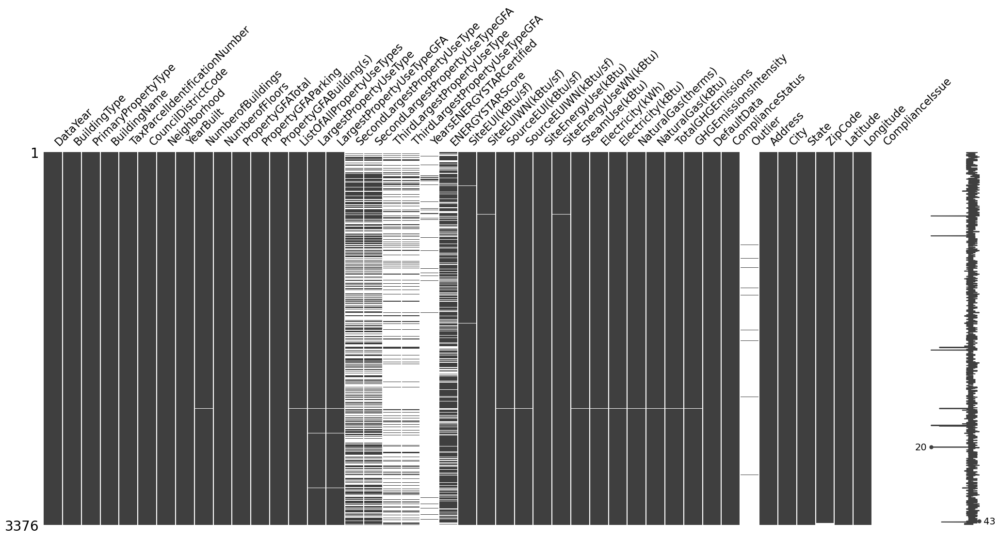

In [37]:
msno.matrix(df)

In [38]:
def describe_df(df):
    list_item = []
    for col in df.columns:
        list_item.append([
            col, 
            df[col].dtype,
            df[col].isna().sum(),
            round(df[col].isna().sum()/len(df[col])*100, 2),
            df[col].nunique(),
            round(df[col].nunique()/len(df[col])*100, 2),
            list(df[col].unique()[:5])
        ])
    return pd.DataFrame(
        columns=['feature', 'type', '# null', '% null', '# unique', '% unique', 'sample'],
        data = list_item
    )

__Irrelevant columns__  

First we remove the columns that aren't relevant for sure:
- 'BuildingName': nearly unique for every recording & not usefull
- 'TaxParcelIdentificationNumber': nearly unique for every recording & not usefull
- 'DataYear': always 2016
- 'City': always Seattle (of course...)
- 'State': same reason
- 'ComplianceIssue': used for later years
- 'YearsENERGYSTARCertified': nearly always null

In [39]:
describe_df(df[['BuildingName', 'TaxParcelIdentificationNumber', 'DataYear', 'City', 'State',
                 'ComplianceIssue', 'YearsENERGYSTARCertified', 'DefaultData', 'Address']])

,feature,type,# null,% null,# unique,% unique,sample
0,BuildingName,object,0,0.00,3362,99.59,"[Mayflower park hotel, Paramount Hotel, 5673-T..."
1,TaxParcelIdentificationNumber,object,0,0.00,3268,96.80,"[0659000030, 0659000220, 0659000475, 065900064..."
2,DataYear,int64,0,0.00,1,0.03,[2016]
3,City,object,0,0.00,1,0.03,[Seattle]
4,State,object,0,0.00,1,0.03,[WA]
5,ComplianceIssue,object,3376,100.00,0,0.00,[nan]
6,YearsENERGYSTARCertified,object,3257,96.48,65,1.93,"[nan, 2016, 2014, 2012, 20172015]"
7,DefaultData,object,0,0.00,2,0.06,"[False, True]"
8,Address,object,0,0.00,3354,99.35,"[405 Olive way, 724 Pine street, 1900 5th Aven..."


In [40]:
df = df.drop(columns=['BuildingName', 'TaxParcelIdentificationNumber', 'City', 'State', \
                 'ComplianceIssue', 'YearsENERGYSTARCertified', 'DefaultData', 'Address']) 
# 'DataYear' drop later

__Type mismatch__  
Does the column's type match the information it contains? Yes for most of the cases but the following ones should be integers : 'YearBuilt', 'CouncilDistrictCode', 'NumberofBuildings', 'NumberofFloors', 'ZipCode'

In [41]:
cols_to_int = ['YearBuilt', 'CouncilDistrictCode', 'NumberofBuildings', 'NumberofFloors', 'ZipCode']
describe_df(df[cols_to_int])

,feature,type,# null,% null,# unique,% unique,sample
0,YearBuilt,float64,0,0.00,113,3.35,"[1927.0, 1996.0, 1969.0, 1926.0, 1980.0]"
1,CouncilDistrictCode,float64,0,0.00,7,0.21,"[7.0, 3.0, 2.0, 4.0, 5.0]"
2,NumberofBuildings,float64,8,0.24,17,0.50,"[1.0, 3.0, 0.0, 2.0, 4.0]"
3,NumberofFloors,float64,0,0.00,50,1.48,"[12.0, 11.0, 41.0, 10.0, 18.0]"
4,ZipCode,float64,16,0.47,55,1.63,"[98101.0, 98121.0, 98104.0, 98154.0, 98118.0]"


Prior to this, we have to replace NaN values, at the same time we see that there are 'NumberOfBuildings' equal to 0:

<AxesSubplot: >

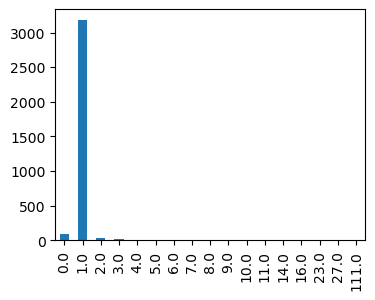

In [42]:
df.NumberofBuildings.value_counts().sort_index().plot(kind='bar', figsize=(4, 3))

<AxesSubplot: >

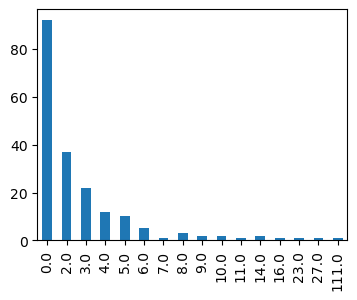

In [43]:
df[df.NumberofBuildings !=1].NumberofBuildings.value_counts().sort_index().plot(kind='bar', figsize=(4, 3))

In [44]:
# df.NumberofBuildings.value_counts().plot(kind='hist', figsize=(3, 3))

df.loc[df.NumberofBuildings > 6, ['NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'TotalGHGEmissions', 'GHGEmissionsIntensity']] \
    .sort_values(by=['NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal'], ascending=True)

,NumberofBuildings,NumberofFloors,PropertyGFATotal,TotalGHGEmissions,GHGEmissionsIntensity
OSEBuildingID,,,,,
828,7.0,14.0,1765970,12307.16,6.97
49705,8.0,0.0,502030,549.11,1.09
23071,8.0,1.0,415632,3278.11,7.89
21196,8.0,4.0,185403,28.60,0.15
24498,9.0,3.0,58523,13.16,0.22
276,9.0,8.0,1158691,10734.57,9.26
24086,10.0,0.0,230971,405.05,1.75
25241,10.0,3.0,166858,28.83,0.17
211,11.0,2.0,694072,362.82,0.52


In [45]:
df.NumberofBuildings.replace([np.nan, 0], df.NumberofBuildings.mode()[0], inplace=True)

Let's use the KNN imputer of scikit-learn to fill the ZipCode Nan based on the location

In [46]:

cols = ['ZipCode', 'Latitude', 'Longitude']
df_tmp = df[cols]
df_tmp = pd.DataFrame(
    data=KNNImputer(n_neighbors=5).fit_transform(df_tmp),
    index=df.index,
    columns=cols
)

df = df.drop(columns=cols).join(df_tmp)

df[cols_to_int] = df[cols_to_int].astype('int')
df[['CouncilDistrictCode', 'ZipCode']] = df[['CouncilDistrictCode', 'ZipCode']].astype('object')

---

__Other missing values__  
There are many columns with the same number of NaNs (in our case less than nine recordings):

In [47]:
cols_with_few_nan = [col for col in df.columns if 0 < df[col].isnull().sum() <= 9]
print("Columns with few NaN:\n", " - ".join(cols_with_few_nan))

# https://thispointer.com/pandas-select-rows-with-all-nan-values-in-all-columns/
# df[df.isnull().all(axis=1)]

print("# rows with ALL nan in this columns' subset:", df[df[cols_with_few_nan].isnull().all(axis=1)].shape[0])
print("# rows with ONE nan in this columns' subset:", df[df[cols_with_few_nan].isnull().any(axis=1)].shape[0])

Columns with few NaN:
 ListOfAllPropertyUseTypes - SiteEUI(kBtu/sf) - SiteEUIWN(kBtu/sf) - SourceEUI(kBtu/sf) - SourceEUIWN(kBtu/sf) - SiteEnergyUse(kBtu) - SiteEnergyUseWN(kBtu) - SteamUse(kBtu) - Electricity(kWh) - Electricity(kBtu) - NaturalGas(therms) - NaturalGas(kBtu) - TotalGHGEmissions - GHGEmissionsIntensity
# rows with ALL nan in this columns' subset: 5
# rows with ONE nan in this columns' subset: 12


As there are very few recordings concerned, we can safely remove them.

In [48]:
df.dropna(subset=cols_with_few_nan, inplace=True)

'LargestPropertyUseType', 'LargestPropertyUseTypeGFA' have NaN on the same rows, it represents less than 1% of nulls, we can also remove those recordings:

In [49]:
print(df[df[['LargestPropertyUseType', 'LargestPropertyUseTypeGFA']].isnull().all(axis=1)].shape[0])
df.dropna(subset=['LargestPropertyUseType', 'LargestPropertyUseTypeGFA'], inplace=True)

11


'SecondLargestPropertyUseType' & 'SecondLargestPropertyUseTypeGFA' are null at the same time.  
'ThirdLargestPropertyUseType' & 'ThirdLargestPropertyUseTypeGFA' are also null at the same time.  
That's quite obvious, but we can easily check that when infos on the 2nd largest property are missing that's also the case for the 3rd one.

In [50]:
# rows where 'SecondLargestPropertyUseType' & 'SecondLargestPropertyUseTypeGFA' have both null:",
# df[df.SecondLargestPropertyUseType.isnull() & df.SecondLargestPropertyUseTypeGFA.isnull()].shape[0]

# rows where 'ThirdLargestPropertyUseType' & 'ThirdLargestPropertyUseTypeGFA' have both null:",
# df[df.ThirdLargestPropertyUseType.isnull() & df.ThirdLargestPropertyUseTypeGFA.isnull()].shape[0]

# df[df.SecondLargestPropertyUseType.isnull() & df.ThirdLargestPropertyUseType.isnull()].shape[0]

That's because the concerned buildings are of only one property. When the 2nd & 3rd properties are missing, the 'NbProperty' juste created before is nearly always unique:

In [51]:
df['NbProperty'] = df.ListOfAllPropertyUseTypes.apply(lambda x: len(x.split(',')))
df[df.SecondLargestPropertyUseType.isnull() & df.ThirdLargestPropertyUseType.isnull()][['NbProperty']].describe().T

,count,mean,std,min,25%,50%,75%,max
NbProperty,1676.0,1.009547,0.161795,1.0,1.0,1.0,1.0,4.0


Knowing that we can replace NaNs by zeros:

In [52]:
df = df.fillna({
    'SecondLargestPropertyUseType': 0, 
    'SecondLargestPropertyUseTypeGFA': 0, 
    'ThirdLargestPropertyUseType': 0,
    'ThirdLargestPropertyUseTypeGFA': 0
})

The last columns with still Nan are "ENERGYSTARScore" & "Outlier", that we'll study later.

CouncilDistrictCode vs ZipCode

In [53]:
pd.crosstab(index=df.ZipCode, columns=df.CouncilDistrictCode).head(10)

CouncilDistrictCode,1,2,3,4,5,6,7
ZipCode,,,,,,,
98006,0,0,0,0,0,0,1
98011,0,0,0,0,0,0,1
98012,0,0,1,0,0,0,0
98013,0,0,0,0,1,1,0
98020,0,0,0,1,0,0,0
98028,0,0,0,0,0,0,1
98033,0,0,0,0,0,0,1
98040,0,1,0,0,0,0,0
98053,1,0,0,0,0,0,0


Property types

In [54]:
pty_cols = [col for col in df.select_dtypes('object').columns if "property" in col.lower()]


health_type = ["health", "hospital", "medical", "surgical", "therapy", "care", "laboratory", "clinic", "patient"]
mixed_type = ["mixed"]
# other_type = ["other"]
industrial_type = ["industrial", "warehouse", "manufacturing", "data center", "distribution", "technology"]
commercial_type = ["commercial", "supermarket", "grocery", "store", "retail", "dealership", "mall", "wholesale", "supercenter"]
services_type = ["service", "self-storage", "bank"]
residential_type = ["residential", "residence", "dormitory", "lodging", "multifamily", "housing"]
office_type = ["office"]
parking_type = ["parking"]
education_type = ["education", "school", "college", "university"]
Public_services_type = ["public service", "police", "courthouse", "fire station", "library"]
hotel_catering_type = ["hotel_catering", "restaurant", "hotel", "bar", "food"]
leisure_type = ["leisure", "performing arts", "entertainment", "fitness", "gym", "meeting", "museum", "convention", 
                "recreation", "lifestyle", "movie", "theater", "swimming pool", "bar", "nightclub", "worship facility"]


all_types = [mixed_type, health_type, industrial_type, commercial_type, services_type, residential_type, office_type, 
             education_type, Public_services_type, hotel_catering_type, leisure_type] # other_type


def clean_type(st):
    return_type = ""
    for type_lst in all_types:
        if any([kw in st.lower() for kw in type_lst]):
            return_type += type_lst[0]
            return_type += " - "
    if return_type == "":
        return "none"
    return return_type.strip()

for col in pty_cols:
    df[col] = df[col].astype('str') 
    df[col] = df[col].apply(clean_type)

it has divided the cardinality by 2

In [55]:
describe_df(df[pty_cols])

,feature,type,# null,% null,# unique,% unique,sample
0,PrimaryPropertyType,object,0,0.0,13,0.39,"[hotel_catering -, none, residential -, mixed ..."
1,ListOfAllPropertyUseTypes,object,0,0.0,144,4.29,"[hotel_catering -, hotel_catering - leisure -,..."
2,LargestPropertyUseType,object,0,0.0,19,0.57,"[hotel_catering -, public service -, leisure -..."
3,SecondLargestPropertyUseType,object,0,0.0,18,0.54,"[none, office -, hotel_catering -, education -..."
4,ThirdLargestPropertyUseType,object,0,0.0,17,0.51,"[none, hotel_catering -, leisure -, industrial..."


In [56]:
df.SecondLargestPropertyUseType.unique()

array(['none', 'office -', 'hotel_catering -', 'education -', 'health -',
       'industrial -', 'commercial -', 'health - service -', 'leisure -',
       'public service -', 'residential -', 'service -',
       'health - office -', 'hotel_catering - leisure -',
       'service - hotel_catering -', 'health - leisure -',
       'service - public service -', 'health - education -'], dtype=object)

### Univariate analysis

BuildingType

In [58]:
px.histogram(df, x='BuildingType', width=500, height=350)#, color="continent")#, template="ggplot2")

Neighborhood

In [91]:
df.Neighborhood = df.Neighborhood.str.lower()
df.Neighborhood.replace('delridge neighborhoods', 'delridge', inplace=True)
px.histogram(df, x='Neighborhood', width=500, height=400)

BuildingAge

Many less constructions were built during WWII. But we can also see that many more buildings were erected after WWII than before. 

In [59]:
px.histogram(df, x="YearBuilt", nbins=20, width=600, height=400).show()
df["BuildingAge"] = df.DataYear - df.YearBuilt
df.drop(columns=["YearBuilt", "DataYear"], inplace = True )
# px.histogram(df, x="BuildingAge", nbins=14, width=700, height=400)

In [60]:
# px.histogram(df, x="NumberofBuildings", width=700, height=400)
# px.histogram(df, x="NumberofFloors", width=700, height=400)

for col in df.select_dtypes('number').columns:
    px.histogram(df, x=col, width=700, height=400).show()

In [61]:
df.PrimaryPropertyType.unique()

array(['hotel_catering -', 'none', 'residential -', 'mixed -',
       'education -', 'commercial - office -', 'service -',
       'industrial -', 'office -', 'health -', 'health - office -',
       'commercial -', 'leisure -'], dtype=object)

probleme 'commercial office', 'health office', 

In [62]:
px.pie(
    df.groupby(["PrimaryPropertyType"]).agg({'TotalGHGEmissions': sum}).reset_index(),
    values='TotalGHGEmissions',
    names='PrimaryPropertyType',
    title='fffffffff',
    width=600,
    height=450
).show()

In [63]:
px.box(
    df[df.TotalGHGEmissions < 1000],
    x="PrimaryPropertyType",
    y="TotalGHGEmissions", 
#     color="smoker",
    notched=True,
    width=800,
    height=450
).show()

In [64]:
px.box(
    df[df.GHGEmissionsIntensity < 10],
    x="PrimaryPropertyType",
    y="GHGEmissionsIntensity", 
#     color="smoker",
    notched=True,
    width=800,
    height=450
).show()

In [65]:
'TotalGHGEmissions', 'GHGEmissionsIntensity'

('TotalGHGEmissions', 'GHGEmissionsIntensity')

In [66]:
# import seaborn as sns

# sns.pairplot(df.select_dtypes("float"));# , hue='BuildingType');

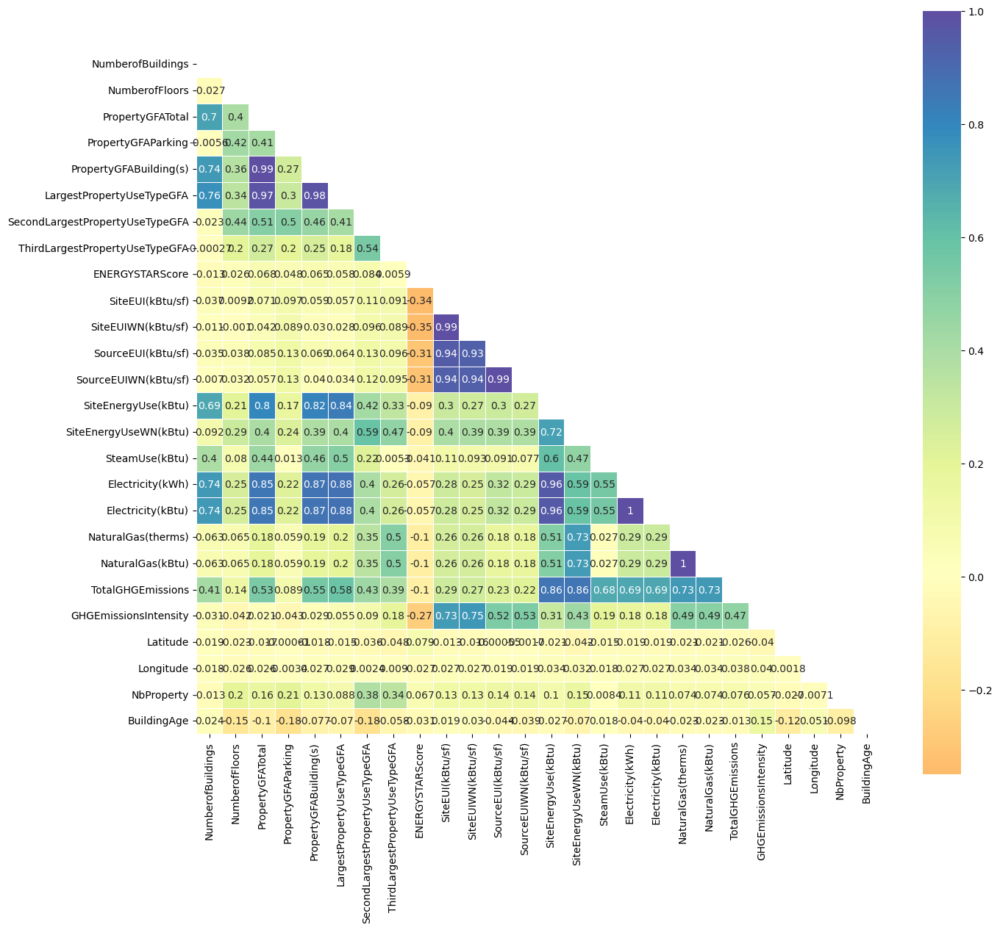

In [67]:
def plot_corr(df_):
    corr = df_.corr()
    #print(corr)

    # Generate a mask for the upper triangle
    mask = np.zeros_like(corr, dtype=np.bool_)
    mask[np.triu_indices_from(mask)] = True

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(15, 27))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(220, 10, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, center=0, square=True, cmap='Spectral', linewidths=.5, cbar_kws={"shrink": .5}, annot=True);

plot_corr(df.select_dtypes("number"))

Inspection of negatives values for the fields "SourceEUIWN(kBtu/sf)", "Electricity(kWh)", and "Electricity(kBtu)"

In [68]:
cols_to_inspect = ["SourceEUIWN(kBtu/sf)", "Electricity(kWh)", "Electricity(kBtu)"]
print("# rows with ALL nan in this columns' subset:", df[(df[cols_to_inspect] < 0).all(axis=1)].shape[0])

display(df.loc[df["SourceEUIWN(kBtu/sf)"] < 0, cols_to_inspect])

df.loc[df["SourceEUIWN(kBtu/sf)"] < 0, cols_to_inspect] = \
    abs(df.loc[df["SourceEUIWN(kBtu/sf)"] < 0, cols_to_inspect])

# rows with ALL nan in this columns' subset: 1


,SourceEUIWN(kBtu/sf),Electricity(kWh),Electricity(kBtu)
OSEBuildingID,,,
49784,-2.1,-33826.80078,-115417.0


## Multivariate analysis

In [69]:
df.groupby(["PrimaryPropertyType", "BuildingAge"]).agg({"GHGEmissionsIntensity": "mean"}).reset_index()

,PrimaryPropertyType,BuildingAge,GHGEmissionsIntensity
0,commercial -,5,5.575000
1,commercial -,6,2.000000
2,commercial -,8,1.796667
3,commercial -,10,2.470000
4,commercial -,11,1.770000
...,...,...,...
830,service -,98,0.420000
831,service -,101,0.010000
832,service -,105,0.640000
833,service -,106,0.600000


In [70]:
px.box(
    df[df.GHGEmissionsIntensity < 10],
    x="PrimaryPropertyType",
    y="GHGEmissionsIntensity", 
#     color="smoker",
    notched=True,
    width=800,
    height=450
).show()

In [76]:
df_temp = df.groupby(["PrimaryPropertyType", "BuildingAge"]).agg({"GHGEmissionsIntensity": "mean"}).reset_index()

# not really usefull
# px.line(
#     df_temp[df_temp.GHGEmissionsIntensity < 10].sort_values(by="BuildingAge"),
#     x="BuildingAge", 
#     y="GHGEmissionsIntensity", 
#     title='eeeeeeeeee',
#     color='PrimaryPropertyType',
#     width=800,
#     height=500
# ).show()

px.histogram(
    df_temp,
    x="BuildingAge", 
    y="GHGEmissionsIntensity", 
    title='eeeeeeeeee',
    color='PrimaryPropertyType',
    barmode='group', 
    nbins=10,
    width=900,
    height=600
).show()

In [79]:
df.PrimaryPropertyType.unique()

array(['hotel_catering -', 'none', 'residential -', 'mixed -',
       'education -', 'commercial - office -', 'service -',
       'industrial -', 'office -', 'health -', 'health - office -',
       'commercial -', 'leisure -'], dtype=object)

In [80]:
px.sunburst(
    df,
    path=['Neighborhood', 'PrimaryPropertyType'], #, 'time', 'sex'],
    values='GHGEmissionsIntensity',
    width=800,
    height=600
).show()

In [117]:
px.sunburst(
    df,
    path=['PrimaryPropertyType', 'Neighborhood', ], #, 'time', 'sex'],
    values='GHGEmissionsIntensity',
    width=800,
    height=600
).show()

In [74]:
df_temp.PrimaryPropertyType.unique()

array(['commercial -', 'commercial - office -', 'education -', 'health -',
       'health - office -', 'hotel_catering -', 'industrial -',
       'leisure -', 'mixed -', 'none', 'office -', 'residential -',
       'service -'], dtype=object)

In [75]:
df_temp[df_temp.PrimaryPropertyType == "commercial"]

,PrimaryPropertyType,BuildingAge,GHGEmissionsIntensity


In [56]:
plt.stackplot(
    x=df_temp.BuildingAge,
    y1, y2, y3, 
    labels=['A','B','C']
)

SyntaxError: positional argument follows keyword argument (1519236463.py, line 5)

In [57]:
df.dtypes

BuildingType                        object
PrimaryPropertyType                 object
CouncilDistrictCode                 object
Neighborhood                        object
NumberofBuildings                    int32
NumberofFloors                       int32
PropertyGFATotal                     int64
PropertyGFAParking                 float64
PropertyGFABuilding(s)             float64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLargestPropertyUseType        object
SecondLargestPropertyUseTypeGFA    float64
ThirdLargestPropertyUseType         object
ThirdLargestPropertyUseTypeGFA     float64
ENERGYSTARScore                    float64
SiteEUI(kBtu/sf)                   float64
SiteEUIWN(kBtu/sf)                 float64
SourceEUI(kBtu/sf)                 float64
SourceEUIWN(kBtu/sf)               float64
SiteEnergyUse(kBtu)                float64
SiteEnergyUseWN(kBtu)              float64
SteamUse(kB

In [58]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
NumberofBuildings,3353.0,1.134506e+00,2.104968e+00,1.00000,1.000000,1.000000e+00,1.000000e+00,1.110000e+02
NumberofFloors,3353.0,4.707128e+00,5.505920e+00,0.00000,2.000000,4.000000e+00,5.000000e+00,9.900000e+01
PropertyGFATotal,3353.0,9.471210e+04,2.183705e+05,11285.00000,28470.000000,4.420200e+04,9.112800e+04,9.320156e+06
PropertyGFAParking,3353.0,8.025412e+03,3.240271e+04,0.00000,0.000000,0.000000e+00,0.000000e+00,5.126080e+05
PropertyGFABuilding(s),3353.0,8.668669e+04,2.073641e+05,3636.00000,27744.000000,4.322800e+04,8.441500e+04,9.320156e+06
LargestPropertyUseTypeGFA,3353.0,7.887869e+04,2.010615e+05,5656.00000,25091.000000,3.988400e+04,7.583000e+04,9.320156e+06
SecondLargestPropertyUseTypeGFA,3353.0,1.403519e+04,3.935145e+04,0.00000,0.000000,0.000000e+00,1.066400e+04,6.399310e+05
ThirdLargestPropertyUseTypeGFA,3353.0,2.086564e+03,1.314753e+04,0.00000,0.000000,0.000000e+00,0.000000e+00,4.597480e+05
ENERGYSTARScore,2525.0,6.796000e+01,2.685411e+01,1.00000,53.000000,7.500000e+01,9.000000e+01,1.000000e+02
SiteEUI(kBtu/sf),3353.0,5.481238e+01,5.638695e+01,0.00000,27.900000,3.870000e+01,6.040000e+01,8.344000e+02


In [59]:
df[['NumberofFloors']].describe().T

,count,mean,std,min,25%,50%,75%,max
NumberofFloors,3353.0,4.707128,5.50592,0.0,2.0,4.0,5.0,99.0


In [60]:
df.NumberofFloors.replace(99, 1, inplace=True)
df.NumberofFloors.replace(0, df.NumberofFloors.median(), inplace=True)

---

# Feature Engineering

In [61]:
df["RateParking"] = round(df.PropertyGFAParking / df.PropertyGFATotal, 4)

df["RateBuilding"] = round(df['PropertyGFABuilding(s)'] / df.PropertyGFATotal, 4)

df["RatePerFloors"] = round(df.PropertyGFATotal / df.NumberofFloors, 4)

df["RatePerBuildings"] = round(df.PropertyGFATotal / df.NumberofBuildings, 4)

df["RateLargestPropertyUseType"] = round(df.LargestPropertyUseTypeGFA / df.PropertyGFATotal, 4)

df["RateSecondLargestPropertyUseType"] = round(df.SecondLargestPropertyUseTypeGFA / df.PropertyGFATotal, 4)
df["RateThirstLargestPropertyUseType"] = round(df.ThirdLargestPropertyUseTypeGFA / df.PropertyGFATotal, 4)

df["NumberOfAllUseTypes"] = df.ListOfAllPropertyUseTypes.str.count(" - ") + 1

useless 'CouncilDistrictCode', 'ListOfAllPropertyUseTypes', 'ENERGYSTARScore'

target 'TotalGHGEmissions'  
supprimer 'GHGEmissionsIntensity'

In [62]:
data = df.drop(columns=['CouncilDistrictCode', 'ListOfAllPropertyUseTypes', 'ENERGYSTARScore', 'GHGEmissionsIntensity', 'Outlier'])

In [63]:
data.shape

(3353, 40)

In [64]:
X = data.drop(columns = ['TotalGHGEmissions'])
y = data[['TotalGHGEmissions']]

In [65]:
X.isnull().sum().sum()

0

shuffle + dummy regressor

In [66]:
# general seed for sk learn
np.random.seed(42)

In [67]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [68]:
from sklearn.preprocessing import RobustScaler

num_cols = X.select_dtypes(include='number').columns
robust_scaler = RobustScaler()

X_train_num_sc = pd.DataFrame(
    robust_scaler.fit_transform(X_train[num_cols]),
    columns=num_cols,
    index=X_train.index
)

In [69]:
X_test_num_sc = pd.DataFrame(
    robust_scaler.transform(X_test[num_cols]),
    columns=num_cols,
    index=X_test.index
)

In [70]:
X_train_num_sc.shape, X_test_num_sc.shape

((2682, 31), (671, 31))

In [71]:
X_train_num_sc.isnull().sum().sum(), X_test_num_sc.isnull().sum().sum()

(0, 0)

In [72]:
# df.isin([np.inf, -np.inf]).sum()

from sklearn.preprocessing import OneHotEncoder

cat_cols = X_train.select_dtypes(exclude='number').columns

ohe = OneHotEncoder(drop='first', sparse=False, handle_unknown='ignore')

X_train_cat_enc = ohe.fit_transform(X_train[cat_cols])
X_train_cat_enc = pd.DataFrame(
    X_train_cat_enc,
    columns=ohe.get_feature_names_out(X_train.select_dtypes(exclude='number').columns),
    index=X_train.index
)

X_test_cat_enc = ohe.transform(X_test[cat_cols])
X_test_cat_enc = pd.DataFrame(
    X_test_cat_enc,
    columns=ohe.get_feature_names_out(X_test.select_dtypes(exclude='number').columns),
    index=X_test.index
)

C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\preprocessing\_encoders.py:188: UserWarning:

Found unknown categories in columns [3, 4, 5, 7] during transform. These unknown categories will be encoded as all zeros



In [73]:
X_train_cat_enc.shape, X_test_cat_enc.shape

((2682, 132), (671, 132))

In [74]:
X_train_cat_enc.isnull().sum().sum(), X_test_cat_enc.isnull().sum().sum()

(0, 0)

In [75]:
X_train_enc = pd.concat([X_train_num_sc, X_train_cat_enc], axis=1)
X_test_enc = pd.concat([X_test_num_sc, X_test_cat_enc], axis=1)

In [76]:
X_train_enc.shape, X_test_enc.shape

((2682, 163), (671, 163))

In [77]:
X_train_enc.isnull().sum().sum(), X_test_enc.isnull().sum().sum()

(0, 0)

In [78]:
X_test_enc[[col for col in X_test_enc.columns if X_test_enc[col].hasnans]].isnull().sum()

Series([], dtype: float64)

In [79]:
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_validate, train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import lightgbm as lgb
from sklearn.svm import SVR, LinearSVR

In [80]:
def regression(model, name, X, y):
    metrics = ['neg_mean_absolute_error', 'neg_mean_squared_error', 'r2']
    score = cross_validate(model, X, y , cv=5, scoring=metrics, return_train_score=True)
    
    dic = {
        'model ': [name],
        'train r²': [score['train_r2'].mean()],
        'test r²': [score['test_r2'].mean()],
        'train RMSE': [np.sqrt(- (score['train_neg_mean_squared_error'].mean()))],
        'test RMSE': [np.sqrt(- (score['test_neg_mean_squared_error'].mean()))],
        'train MAE': [np.sqrt(- (score['train_neg_mean_absolute_error'].mean()))],
        'test MAE': [np.sqrt(- (score['test_neg_mean_absolute_error'].mean()))],
    }
    return pd.DataFrame(dic)

In [81]:
def compare_results(X, y):
    results = pd.DataFrame()
    model = []
    model.append(('dummy_regressor', DummyRegressor()))
    model.append(('svr', SVR()))
    model.append(('decision_tree', DecisionTreeRegressor()))
    model.append(('random_forest', RandomForestRegressor()))
    model.append(('adaBoost', AdaBoostRegressor()))
    model.append(('lgbm', lgb.LGBMRegressor()))
    
    for name, mod in model:
        res = regression(mod, name, X, y)
        results = pd.concat([results, res], ignore_index=True)
    return results.style.hide_index()

In [82]:
compare_results(X_train_enc, y_train)

C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\obrunet

model,train r²,test r²,train RMSE,test RMSE,train MAE,test MAE
dummy_regressor,0.000000,-0.011977,522.130882,522.457472,11.528955,11.531474
svr,-0.017553,-0.035544,526.641611,526.707688,10.058145,10.061211
decision_tree,1.000000,0.514521,0.000000,396.276333,0.000000,5.379563
random_forest,0.943852,0.802186,123.545703,278.594384,2.768394,4.380043
adaBoost,0.928146,0.437565,133.031363,391.653795,10.337620,11.110339
lgbm,0.759761,0.215260,255.017932,408.757414,5.362348,6.843762


In [83]:
from sklearn.metrics import mean_squared_error

In [84]:
model_list = [
    DummyRegressor(),
    SVR(),
    DecisionTreeRegressor(),
    RandomForestRegressor(),
    AdaBoostRegressor(),
    lgb.LGBMRegressor(),
    GradientBoostingRegressor(),
    ExtraTreesRegressor()
]

In [85]:
X_test_enc.isnull().sum().sum()

0

In [86]:
model_names = [str(m)[:str(m).index('(')] for m in model_list]
rmse_train, rmse_test = [], []

def get_rmse(reg, model_name):
    """Print the score for the model passed in argument & return scores for the train / test sets"""
    y_train_pred, y_pred = reg.predict(X_train_enc), reg.predict(X_test_enc)
    rmse_train, rmse_test = np.sqrt(mean_squared_error(y_train, y_train_pred)), np.sqrt(mean_squared_error(y_test, y_pred))
    print(model_name, f'\t - RMSE on training = {rmse_train:.2f} / on test = {rmse_test:.2f}')
    return rmse_train, rmse_test


# fit and predict all models
for model, name in zip(model_list, model_names):
    model.fit(X_train_enc, y_train)
    sc_train, sc_test = get_rmse(model, name)
    rmse_train.append(sc_train)
    rmse_test.append(sc_test)
    

df_score = pd.DataFrame({
    'model_names': model_names,
    'rmse_train': rmse_train,
    'rmse_test': rmse_test
})

C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



DummyRegressor 	 - RMSE on training = 522.15 / on test = 605.41
SVR 	 - RMSE on training = 526.22 / on test = 611.72
DecisionTreeRegressor 	 - RMSE on training = 0.00 / on test = 216.27


C:\Users\obrunet\AppData\Local\Temp\ipykernel_15108\903984297.py:14: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor 	 - RMSE on training = 125.97 / on test = 232.83


C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\utils\validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



AdaBoostRegressor 	 - RMSE on training = 119.49 / on test = 266.86
LGBMRegressor 	 - RMSE on training = 225.33 / on test = 226.95


C:\Users\obrunet\Anaconda3\envs\nrj\lib\site-packages\sklearn\ensemble\_gb.py:570: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



GradientBoostingRegressor 	 - RMSE on training = 6.12 / on test = 165.64


C:\Users\obrunet\AppData\Local\Temp\ipykernel_15108\903984297.py:14: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



ExtraTreesRegressor 	 - RMSE on training = 0.00 / on test = 95.46


In [87]:
df_score

,model_names,rmse_train,rmse_test
0,DummyRegressor,5.221517e+02,605.411012
1,SVR,5.262221e+02,611.716752
2,DecisionTreeRegressor,7.019048e-17,216.271825
3,RandomForestRegressor,1.259708e+02,232.832167
4,AdaBoostRegressor,1.194949e+02,266.861787
5,LGBMRegressor,2.253285e+02,226.945393
6,GradientBoostingRegressor,6.117585e+00,165.640185
7,ExtraTreesRegressor,7.430878e-13,95.458553


In [88]:
df_score_melt = pd.melt(df_score, id_vars=['model_names'], value_vars=['rmse_train', 'rmse_test'])

In [89]:
df_score_melt

,model_names,variable,value
0,DummyRegressor,rmse_train,5.221517e+02
1,SVR,rmse_train,5.262221e+02
2,DecisionTreeRegressor,rmse_train,7.019048e-17
3,RandomForestRegressor,rmse_train,1.259708e+02
4,AdaBoostRegressor,rmse_train,1.194949e+02
5,LGBMRegressor,rmse_train,2.253285e+02
6,GradientBoostingRegressor,rmse_train,6.117585e+00
7,ExtraTreesRegressor,rmse_train,7.430878e-13
8,DummyRegressor,rmse_test,6.054110e+02
9,SVR,rmse_test,6.117168e+02


<AxesSubplot: xlabel='value', ylabel='model_names'>

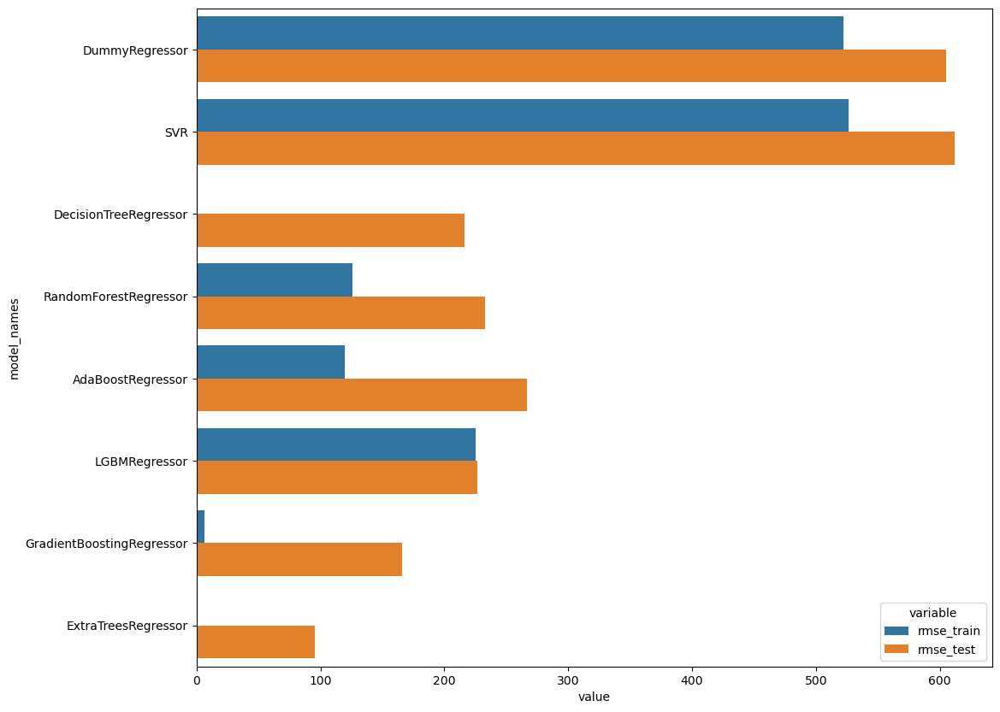

In [90]:
plt.figure(figsize=(12, 10))
sns.barplot(y="model_names", x="value", hue="variable", data=df_score_melt)

In [90]:
px.histogram(
    df_score_melt,
    x="model_names",
    y="value",
    color='variable',
    barmode='group',
    width=500,
    height=350
).show()

NameError: name 'df_score_melt' is not defined